# Légende
* [Mise en place de l'environnement de travail](#1)
    * [Installation des packages](#11)
    * [Téléchargement des données à partir de Kaggle](#12)
* [pré-processing](#2)
    * [Chargement des fichiers csv](#21)
    * [Jointure des fichier par names](#22)
    * [Plot de la distribution du nombre de classes](#23)
    * [Distribution des labels](#24)
        * [Distribution des données test et train](#241)
        * [Distribution des données regroupées par catégorie](#242)
        * [Distribution des données regrouper par année](#243)
        * [Distribution des données sans distinction entre les années](#244)
        * [Distribution des données regroupées par marques](#245)
    * [Data augmentation](#25)
    * [Data shuffling](#26)
    * [Data loaders](#27)
* [Entraînement de notre modèle](#3)
    * [Entraînement direct des poids](#31)
    * [Fine-tuning en gelant les poids de pré-entraînements](#32)
* [Explicabilité](#4)
    * [Précision et pertes](#41)
    * [Matrice de confusion](#42)
    * [Extraction des features](#43)
        * [Premier layer d'activation](#431)
        * [Dernier layer d'activation](#432)
    * [Analyse des erreurs](#44)
        * [Analyse des erreurs en fonction des catégories](#441)
        * [Analyse des erreurs Intra-Classe](#442)
    * [Grad-cam](#45)
        * [Comparaison de 2 modèles de voitures ressemblant](#451)
        * [Décomposition des masques](#452)


# Mise en place de l’environnement de travail <a class="anchor" id="1"></a>
## Installation des packages <a class="anchor" id="11"></a>

Les packages Python sont installés automatiquement à partir du fichier `requirements.txt`

In [1]:
# download requirement
!pip install -r requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.7/79.7 kB 4.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 159.5/159.5 kB 19.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 51.1 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 50.0 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 30.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 306.0/306.0 kB 15.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 44.6 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 22.5 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 103.2/103.2 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 345.4/345.4 kB 12.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.2/78.2 kB 6.7 MB/s eta 0:00:00
  Created wheel for kaggle: filename=kaggle-1.

In [ ]:
import time, collections, os, random, s3fs, zipfile, warnings
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.models as models
import torchvision.datasets as datasets
import torchvision.transforms as transforms

from torchvision.transforms import ToPILImage
from torchvision.utils import make_grid
from torch.utils.data import DataLoader, Subset
from torchvision.io.image import read_image

from pytorch_grad_cam import GradCAM, EigenGradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget, ClassifierOutputSoftmaxTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.metrics.road import ROADCombined, ROADMostRelevantFirst

from matplotlib.colors import LinearSegmentedColormap

from PIL import Image

from tqdm import tqdm

## Téléchargement des données à partir de Kaggle <a class="anchor" id="12"></a>

On télécharge les données grâce à l'API Kaggle de Python

In [2]:
# download dataset zip from Kaggle
!kaggle datasets download jutrera/stanford-car-dataset-by-classes-folder

# unzip data into data folder
!unzip stanford-car-sdataset-by-classes-folder.zip -d data/

Dataset URL: https://www.kaggle.com/datasets/jutrera/stanford-car-dataset-by-classes-folder
License(s): other
100%|█████████████████████████████████████▉| 1.82G/1.83G [00:51<00:00, 47.5MB/s]
100%|██████████████████████████████████████| 1.83G/1.83G [00:51<00:00, 37.9MB/s]
Archive:  stanford-car-dataset-by-classes-folder.zip
  inflating: data/anno_test.csv      
  inflating: data/anno_train.csv     
  inflating: data/car_data/car_data/test/AM General Hummer SUV 2000/00076.jpg  
  inflating: data/car_data/car_data/test/AM General Hummer SUV 2000/00457.jpg  
  inflating: data/car_data/car_data/test/AM General Hummer SUV 2000/00684.jpg  
  inflating: data/car_data/car_data/test/AM General Hummer SUV 2000/01117.jpg  
  inflating: data/car_data/car_data/test/AM General Hummer SUV 2000/01167.jpg  
  inflating: data/car_data/car_data/test/AM General Hummer SUV 2000/01199.jpg  
  inflating: data/car_data/car_data/test/AM General Hummer SUV 2000/01226.jpg  
  inflating: data/car_data/car_data/tes

# pré-processing <a class="anchor" id="2"></a>
## Chargement des fichiers csv <a class="anchor" id="21"></a>

In [4]:
def read_csv_file(filename, cols):
    df = pd.read_csv(f'data/{filename}.csv', header=None, names=cols)
    print(df.shape)
    return df

In [5]:
names = read_csv_file('names', cols=['name'])
names['id'] = np.arange(1, 197)
names.head()

(196, 1)


,name,id
0,AM General Hummer SUV 2000,1
1,Acura RL Sedan 2012,2
2,Acura TL Sedan 2012,3
3,Acura TL Type-S 2008,4
4,Acura TSX Sedan 2012,5


In [6]:
train = read_csv_file('anno_train', cols=['jpg', 'a', 'b', 'c', 'id'])
print(train['id'].unique().shape)
train.head()

(8144, 5)
(196,)


,jpg,a,b,c,id
00001.jpg,39,116,569,375,14
00002.jpg,36,116,868,587,3
00003.jpg,85,109,601,381,91
00004.jpg,621,393,1484,1096,134
00005.jpg,14,36,133,99,106


In [7]:
test = read_csv_file('anno_test', cols=['jpg', 'a', 'b', 'c', 'id'])
print(test['id'].unique().shape)
test.head()

(8041, 5)
(196,)


,jpg,a,b,c,id
00001.jpg,30,52,246,147,181
00002.jpg,100,19,576,203,103
00003.jpg,51,105,968,659,145
00004.jpg,67,84,581,407,187
00005.jpg,140,151,593,339,185


## Jointure des fichier par names <a class="anchor" id="22"></a>
Le but est de récupérer pour chaque données de train et de test, le nom du modèle correspondant

In [8]:
def get_model_name(df, name_df):
    df = pd.merge(df, name_df, on='id')
    df = df.drop(['id'], axis=1)
    return df

In [9]:
train = get_model_name(train, names)
test = get_model_name(test, names)

## Plot de la distribution du nombre de classes <a class="anchor" id="23"></a>

- On cherche à observer si il existe des classes qui sont plus présentent dans nos données.
- En cas de déséquilibre, cela pourrait engendrer un biais

In [305]:
test['name'].value_counts().sort_values(ascending=True).reset_index().head()
train['name'].value_counts().sort_values(ascending=True).reset_index().head()

,name,count
0,Hyundai Accent Sedan 2012,24
1,FIAT 500 Abarth 2012,28
2,Maybach Landaulet Convertible 2012,29
3,Chevrolet Express Cargo Van 2007,30
4,Rolls-Royce Phantom Drophead Coupe Convertible...,31


In [298]:
def plot_class_count(df, col, title):
    fig = plt.figure(figsize=(40, 10))

    value_counts = df[col].value_counts().sort_values(ascending=False).reset_index()
    value_counts.columns = [col, 'counts']  
 
    # Tracer l'histogramme avec les valeurs triées
    sns.barplot(data=value_counts, x=col, y='counts', color='grey')    
    plt.xticks(rotation=90)

    value_counts = df[col].value_counts()
    min_val = value_counts.min()
    max_val = value_counts.max()
    mean_val = value_counts.mean()

    # Tracer les lignes pour min, max et mean
    plt.axhline(min_val, color='red', linestyle='--', label='Min')
    plt.axhline(max_val, color='red', linestyle='--', label='Max')
    plt.axhline(mean_val, color='blue', linestyle='--', label='Mean')
    plt.title(title)
    plt.legend()
    plt.show()

In [289]:
def distribution_df(df_train, df_test, col, title):
    fig = plt.figure(figsize=(6, 3))
    train_counts = df_train[col].value_counts()
    test_counts = df_test[col].value_counts()
    
    sns.kdeplot(train_counts, fill=True, label="train set", color='red')
    sns.kdeplot(test_counts, fill=True, label="test set", color='blue')
    plt.title(title)
    plt.legend()
    plt.show()

In [ ]:
train['year'] = train['name'].str.extract(r'(\b\d{4}\b)$')
train['model_name'] = train['name'].str.replace(r'\b\d{4}\b$', '', regex=True)
test['year'] = test['name'].str.extract(r'(\b\d{4}\b)$')
test['model_name'] = test['name'].str.replace(r'\b\d{4}\b$', '', regex=True)

train['marque'] = train['model_name'].str.extract(r'^(\w+(-\w+)?)')[0]
test['marque'] = test['model_name'].str.extract(r'^(\w+(-\w+)?)')[0]
df = pd.concat([train, test])

## Distribution des labels <a class="anchor" id="24"></a>
### Distribution des données test et train <a class="anchor" id="241"></a>

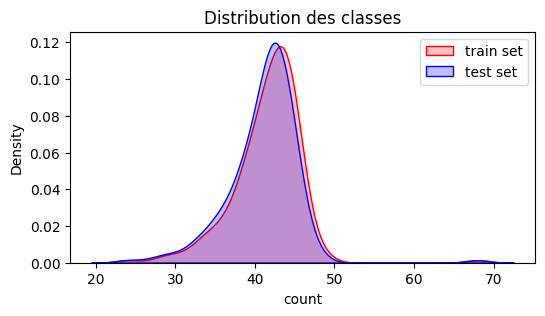

In [292]:
distribution_df(train, test, col='name', title='Distribution des classes')

### Distribution des données regroupées par catégorie <a class="anchor" id="242"></a>
#### Train

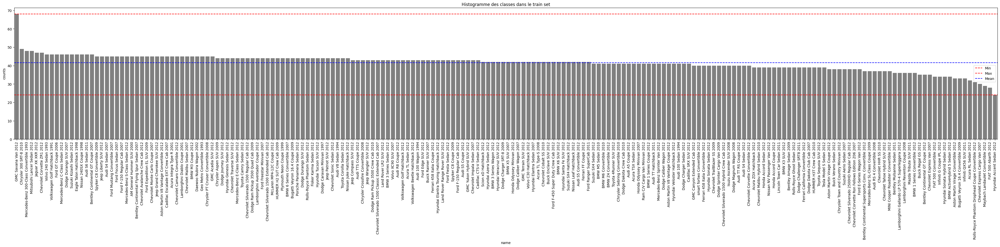

In [297]:
plot_class_count(train, col='name', title='Histogramme des classes dans le train set')

#### Test

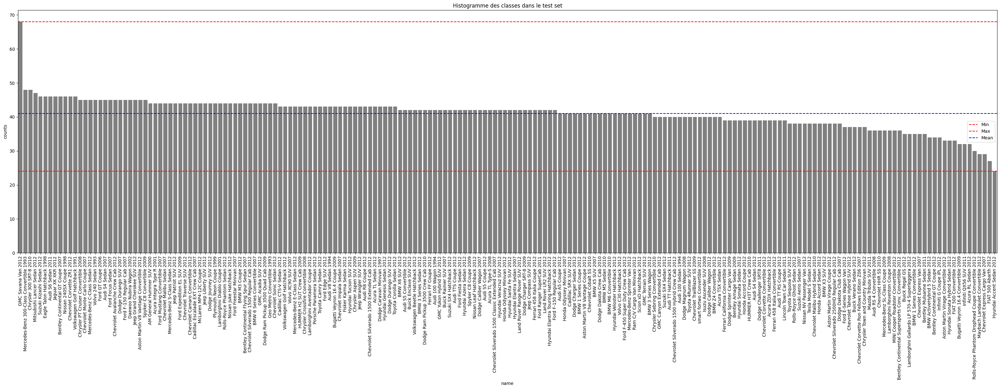

In [295]:
plot_class_count(test, col='name', title='Histogramme des classes dans le test set')

#### Dataframe

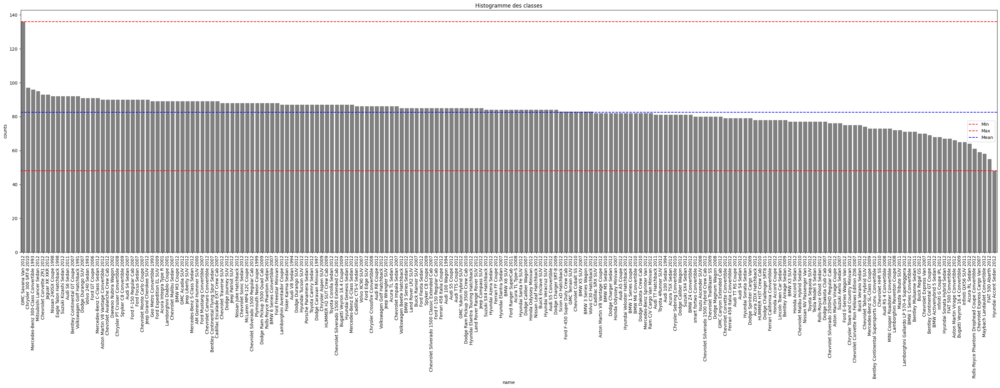

In [323]:
plot_class_count(df, col='name', title='Histogramme des classes')

### Distribution des données regrouper par année <a class="anchor" id="243"></a>

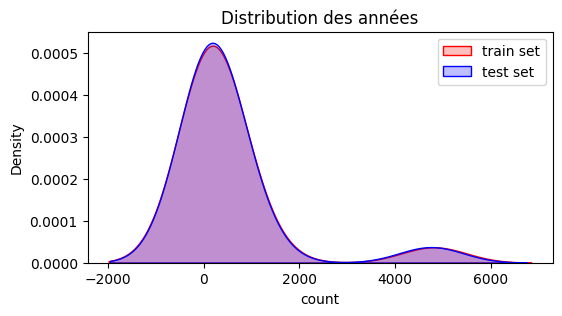

In [306]:
distribution_df(train, test, col='year', title='Distribution des années')

#### Train

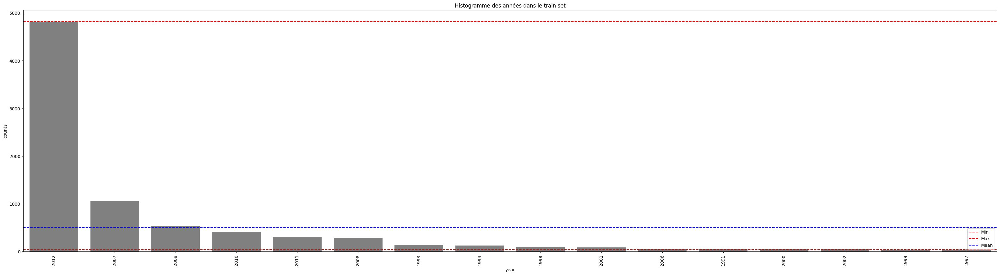

In [308]:
plot_class_count(train, col='year', title='Histogramme des années dans le train set')

#### Test

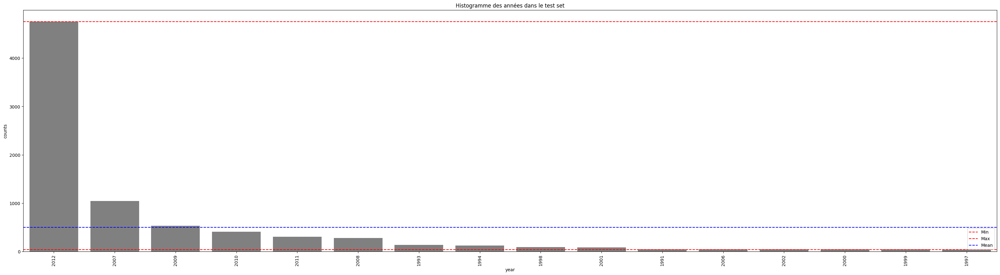

In [314]:
plot_class_count(test, col='year', title='Histogramme des années dans le test set')

#### Dataframe

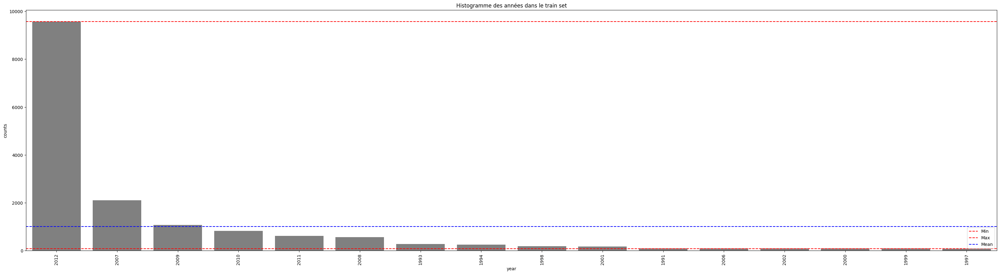

In [324]:
plot_class_count(df, col='year', title='Histogramme des années dans le train set')

### Distribution des données sans distinction entre les années <a class="anchor" id="244"></a>

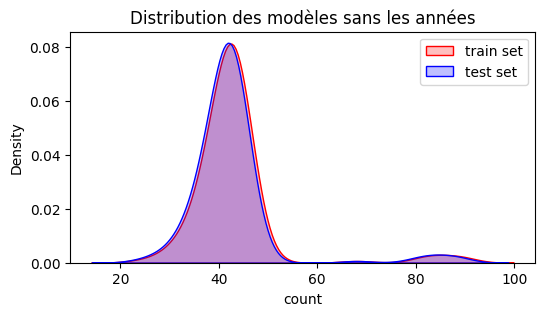

In [313]:
distribution_df(train, test, col='model_name', title='Distribution des modèles sans les années')

#### Train

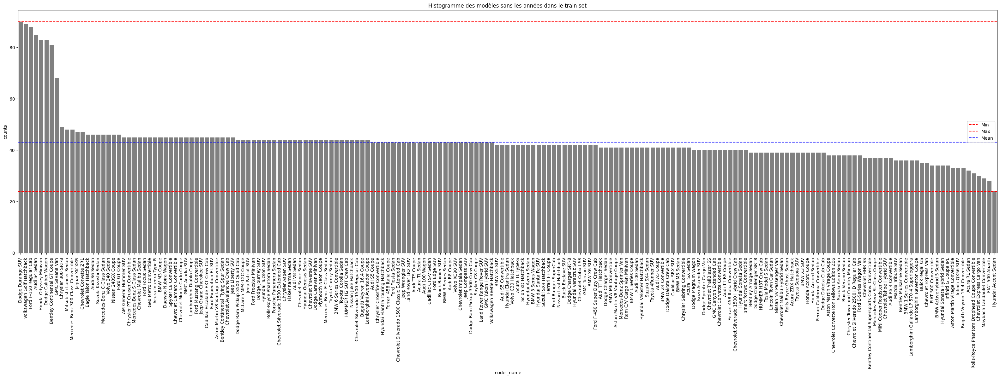

In [315]:
plot_class_count(train, col='model_name', title='Histogramme des modèles sans les années dans le train set')

#### Test

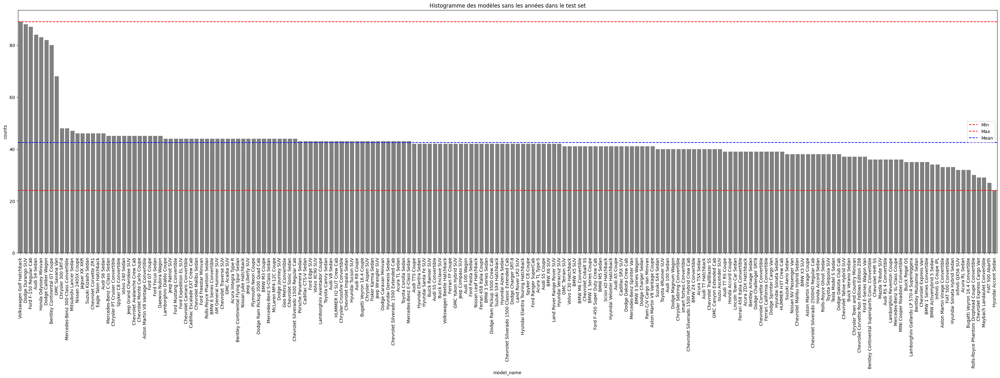

In [316]:
plot_class_count(test, col='model_name', title='Histogramme des modèles sans les années dans le test set')

#### Dataframe

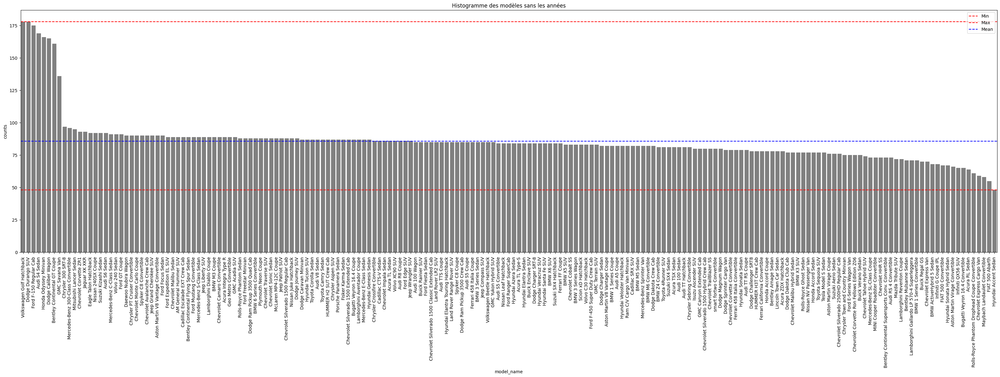

In [321]:
plot_class_count(df, col='model_name', title='Histogramme des modèles sans les années')

### Distribution des données regroupées par marques <a class="anchor" id="245"></a>

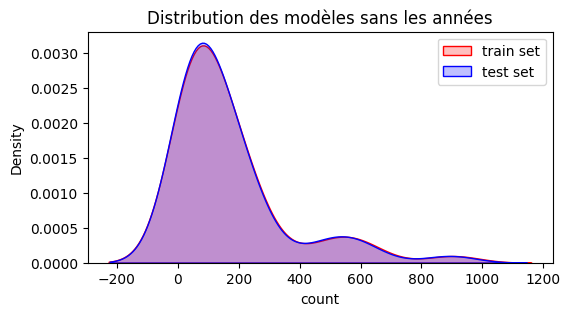

In [347]:
distribution_df(train, test, col='marque', title='Distribution des modèles sans les années')

##### Train

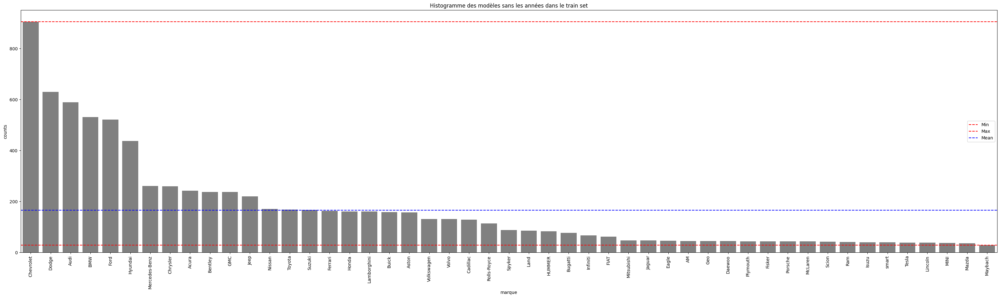

In [318]:
plot_class_count(train, col='marque', title='Histogramme des modèles sans les années dans le train set')

#### Test

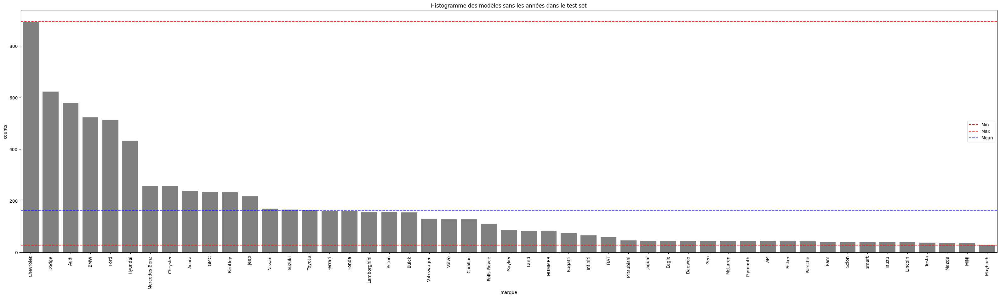

In [319]:
plot_class_count(test, col='marque', title='Histogramme des modèles sans les années dans le test set')

#### Dataframe

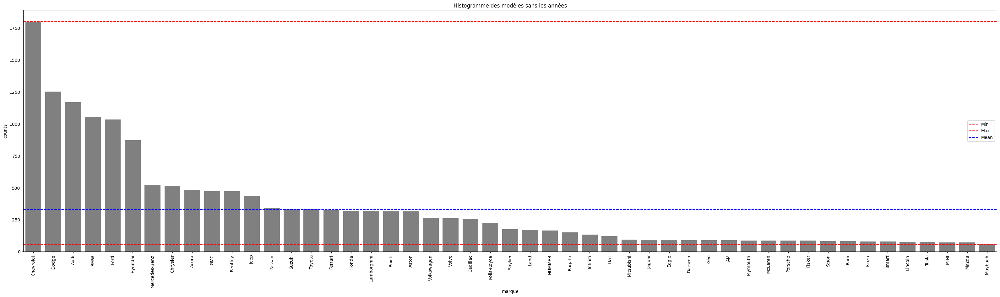

In [320]:
plot_class_count(df, col='marque', title='Histogramme des modèles sans les années')

In [ ]:
if torch.cuda.is_available():
    device = torch.device("cuda")
    print("Using GPU:", torch.cuda.get_device_name(0))
else:
    device = torch.device("cpu")
    print("GPU not available, using CPU instead.")

Using GPU: Tesla P100-PCIE-16GB


## Data augmentation <a class="anchor" id="25"></a>

In [ ]:
path = '/kaggle/input/resnet18-best/pytorch/res18/1/best_model.pth'
model = torch.load(path)

BATCH_SIZE = 32

In [ ]:
transform = transforms.Compose([
    transforms.Resize((400, 400)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

test_tfms = transforms.Compose([
    transforms.Resize((400, 400)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

In [ ]:
def train_test_split(dataset, train_split=0.8):
    num_train = int(len(dataset) * train_split)
    indices = list(range(len(dataset)))
    np.random.shuffle(indices)

    train_indices = indices[:num_train]
    test_indices = indices[num_train:]

    train_subset = Subset(dataset, train_indices)
    test_subset = Subset(dataset, test_indices)

    return train_subset, test_subset

In [ ]:
train_set = datasets.ImageFolder('/kaggle/input/stanford-car-dataset-by-classes-folder/car_data/car_data/train', transform=transform)
test_set = datasets.ImageFolder('/kaggle/input/stanford-car-dataset-by-classes-folder/car_data/car_data/test', transform=test_tfms)

## Data shuffling <a class="anchor" id="26"></a>

In [ ]:
total_dataset = torch.utils.data.ConcatDataset([train_set, test_set])
train_set, test_set = train_test_split(total_dataset)

## Data loaders <a class="anchor" id="27"></a>

In [ ]:
train_loader = DataLoader(train_set, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)
test_loader = DataLoader(test_set, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

In [ ]:
def imshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

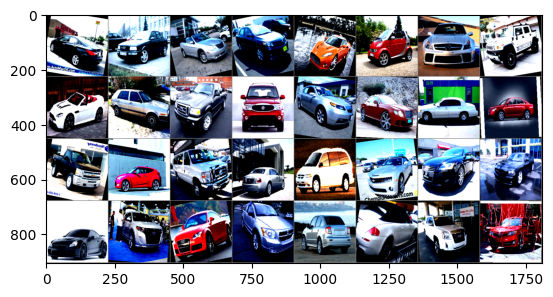

In [ ]:
# get some random training images
dataiter = iter(train_loader)
images, labels = next(dataiter)

# show images
imshow(torchvision.utils.make_grid(images))

# Entraînement de notre modèle <a class="anchor" id="3"></a>
## Entraînement direct des poids <a class="anchor" id="31"></a>

In [ ]:
def train_model(model, criterion, optimizer, scheduler, n_epochs = 5):
    
    losses = []
    accuracies = []
    test_accuracies = []
    # set the model to train mode initially
    model.train()
    model=model.to('cuda')
    for epoch in range(n_epochs):
        since = time.time()
        running_loss = 0.0
        running_correct = 0.0
        for i, data in enumerate(train_loader, 0):

            # get the inputs and assign them to cuda
            inputs, labels = data
            
            inputs, labels = inputs.cuda(), labels.cuda()
            optimizer.zero_grad()
             # forward + backward + optimize
                
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            # calculate the loss/acc later
            running_loss += loss.item()
            running_correct += (labels==predicted).sum().item()

        epoch_duration = time.time()-since
        epoch_loss = running_loss/len(train_loader)
        epoch_acc = 100/BATCH_SIZE*running_correct/len(train_loader)
        print("Epoch %s, duration: %d s, loss: %.4f, acc: %.4f" % (epoch+1, epoch_duration, epoch_loss, epoch_acc))
        
        losses.append(epoch_loss)
        accuracies.append(epoch_acc)
        model.eval()
        test_acc = eval_model(model)
        test_accuracies.append(test_acc)
        
        # re-set the model to train mode after validating
        model.train()
        scheduler.step(test_acc)
        since = time.time()
    print('Finished Training')
    return model, losses, accuracies, test_accuracies

In [ ]:
def eval_model(model):
    correct = 0.0
    total = 0.0
    with torch.no_grad():
        for i, data in enumerate(test_loader, 0):
            images, labels = data
            
            images = images.to(device)
            labels = labels.to(device)
            
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
        test_acc = 100.0 * correct / total
    print('Accuracy of the network on the test images: %d %%' % (
        test_acc))
    return test_acc

In [ ]:
model = models.resnet18(pretrained=True)

num_ftrs = model.fc.in_features
model.fc = torch.nn.Linear(num_ftrs, 196)
model.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)
lrscheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=3, threshold = 0.9)

In [ ]:
model, training_losses, training_accs, test_accs = train_model(model, criterion, optimizer, lrscheduler, n_epochs=20)

Epoch 1, duration: 53 s, loss: 4.3567, acc: 10.8824
Accuracy of the network on the test images: 27 %
Epoch 2, duration: 52 s, loss: 2.0673, acc: 50.0858
Accuracy of the network on the test images: 55 %
Epoch 3, duration: 52 s, loss: 1.0644, acc: 73.8235
Accuracy of the network on the test images: 66 %
Epoch 4, duration: 51 s, loss: 0.6379, acc: 84.6936
Accuracy of the network on the test images: 72 %
Epoch 5, duration: 52 s, loss: 0.4064, acc: 90.9191
Accuracy of the network on the test images: 78 %
Epoch 6, duration: 52 s, loss: 0.2771, acc: 93.7010
Accuracy of the network on the test images: 81 %
Epoch 7, duration: 52 s, loss: 0.1433, acc: 97.3407
Accuracy of the network on the test images: 88 %
Epoch 8, duration: 51 s, loss: 0.1037, acc: 98.2108
Accuracy of the network on the test images: 88 %
Epoch 9, duration: 51 s, loss: 0.0953, acc: 98.4681
Accuracy of the network on the test images: 89 %
Epoch 10, duration: 52 s, loss: 0.0860, acc: 98.6765
Accuracy of the network on the test im

## Fine-tuning en gelant les poids de pré-entraînements <a class="anchor" id="32"></a>

We only train the last fully connected layers first while freezing the pre-trained weights. After few epochs, we then train all the weights. This will allow us to initialize the weight of last fully connected layer into with better values rather than starting from a random initialization

In [ ]:
model = models.resnet18(pretrained=True)
for param in model.parameters():
    param.requires_grad = False

num_ftrs = model.fc.in_features
model.fc = torch.nn.Linear(num_ftrs, 196)
model.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

### Training parameters

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer_ft = optim.SGD(model.fc.parameters(), lr=0.01, momentum=0.9)
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
#optimizer_ft = optim.AdamW(model.fc.parameters(), lr=0.001, weight_decay=0.01)
#optimizer = optim.AdamW(model.parameters(), lr=0.0001, weight_decay=0.01)
#optimizer_ft = optim.Adam(model.fc.parameters(), lr=3e-3)
#optimizer = optim.Adam(model.parameters(), lr=3e-4)
#lrscheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)
lrscheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=3, threshold = 0.9)

### Training

In [ ]:
model, training_losses, training_accs, test_accs = train_model(model, criterion, optimizer_ft, lrscheduler, n_epochs=5)
for param in model.parameters():
    param.requires_grad = True
model, training_losses, training_accs, test_accs = train_model(model, criterion, optimizer, lrscheduler, n_epochs=15)

Epoch 1, duration: 51 s, loss: 4.7069, acc: 7.7392
Accuracy of the network on the test images: 17 %
Epoch 2, duration: 52 s, loss: 3.4632, acc: 24.6682
Accuracy of the network on the test images: 22 %
Epoch 3, duration: 51 s, loss: 2.9030, acc: 34.5293
Accuracy of the network on the test images: 26 %
Epoch 4, duration: 51 s, loss: 2.5619, acc: 40.7176
Accuracy of the network on the test images: 31 %
Epoch 5, duration: 51 s, loss: 2.3183, acc: 45.6481
Accuracy of the network on the test images: 32 %
Finished Training
Epoch 1, duration: 55 s, loss: 1.7384, acc: 60.9105
Accuracy of the network on the test images: 46 %
Epoch 2, duration: 55 s, loss: 1.3724, acc: 70.0617
Accuracy of the network on the test images: 52 %
Epoch 3, duration: 54 s, loss: 1.1993, acc: 74.5139
Accuracy of the network on the test images: 55 %
Epoch 4, duration: 55 s, loss: 1.0752, acc: 77.6852
Accuracy of the network on the test images: 57 %
Epoch 5, duration: 55 s, loss: 0.9688, acc: 80.6327
Accuracy of the networ


KeyboardInterrupt



In [ ]:
model, training_losses, training_accs, test_accs = train_model(model, criterion, optimizer, lrscheduler, n_epochs=5)

Epoch 1, duration: 55 s, loss: 0.0445, acc: 99.1127
Accuracy of the network on the test images: 80 %
Epoch 2, duration: 55 s, loss: 0.0293, acc: 99.3981
Accuracy of the network on the test images: 81 %
Epoch 3, duration: 54 s, loss: 0.0321, acc: 99.3981
Accuracy of the network on the test images: 83 %
Epoch 4, duration: 54 s, loss: 0.0341, acc: 99.3056
Accuracy of the network on the test images: 83 %
Epoch 5, duration: 55 s, loss: 0.0194, acc: 99.5293
Accuracy of the network on the test images: 82 %
Finished Training


# Explicabilité <a class="anchor" id="4"></a>

## Précision et pertes <a class="anchor" id="41"></a>

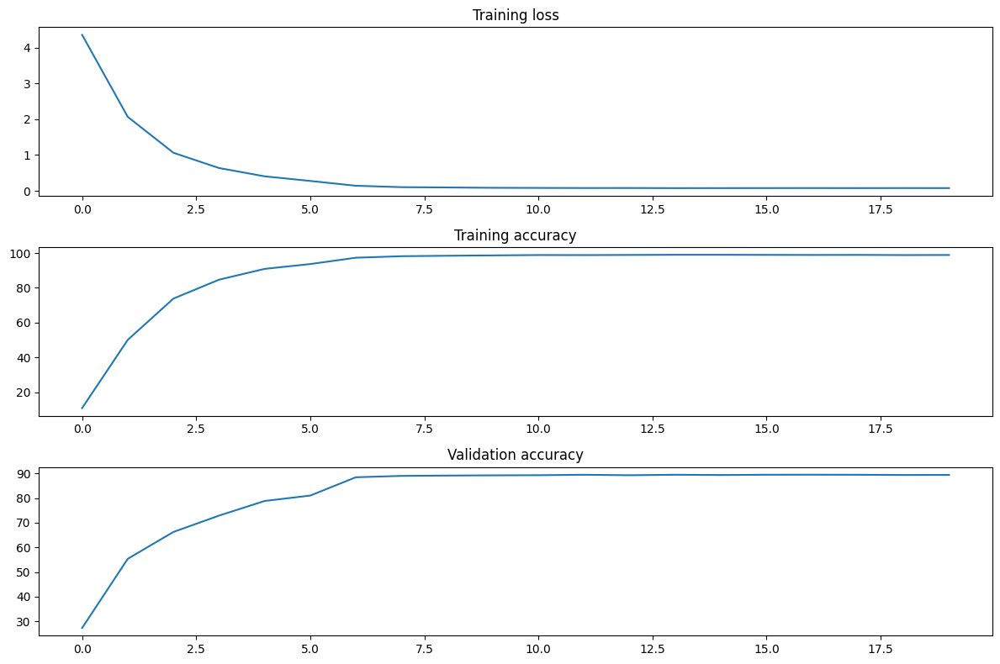

In [ ]:
f, axarr = plt.subplots(3, 1, figsize=(12, 8))

# Plotting training losses on the first subplot
axarr[0].plot(training_losses)
axarr[0].set_title("Training loss")

# Plotting training accuracy on the second subplot
axarr[1].plot(training_accs)
axarr[1].set_title("Training accuracy")

# Plotting test accuracies on the third subplot
axarr[2].plot(test_accs)
axarr[2].set_title("Validation accuracy")

# Display the plots
plt.tight_layout()  # Adjust layout to make room for titles/labels
plt.show()

In [ ]:
torch.save(model, 'best_model.pth')

In [ ]:
accuracies = df_cm.apply(lambda x: x[x.name] / x.sum(), axis=1)

print("Accuracy per Class:\n", accuracies)

Accuracy per Class:
 0      0.777778
1      0.923077
2      0.909091
3      0.909091
4      1.000000
         ...   
191    0.894737
192    0.875000
193    0.800000
194    0.947368
195    1.000000
Length: 196, dtype: float64


## Matrice de confusion <a class="anchor" id="42"></a>

In [ ]:
colors = ["white", "blue"]
cmap = LinearSegmentedColormap.from_list("custom_blue", colors)
nb_classes = 196
confusion_matrix = np.zeros((nb_classes, nb_classes))
with torch.no_grad():
    for i, (inputs, classes) in enumerate(test_loader):
        inputs = inputs.to(device)
        classes = classes.to(device)
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        for t, p in zip(classes.view(-1), preds.view(-1)):
                confusion_matrix[t.long(), p.long()] += 1

df_cm = pd.DataFrame(confusion_matrix)

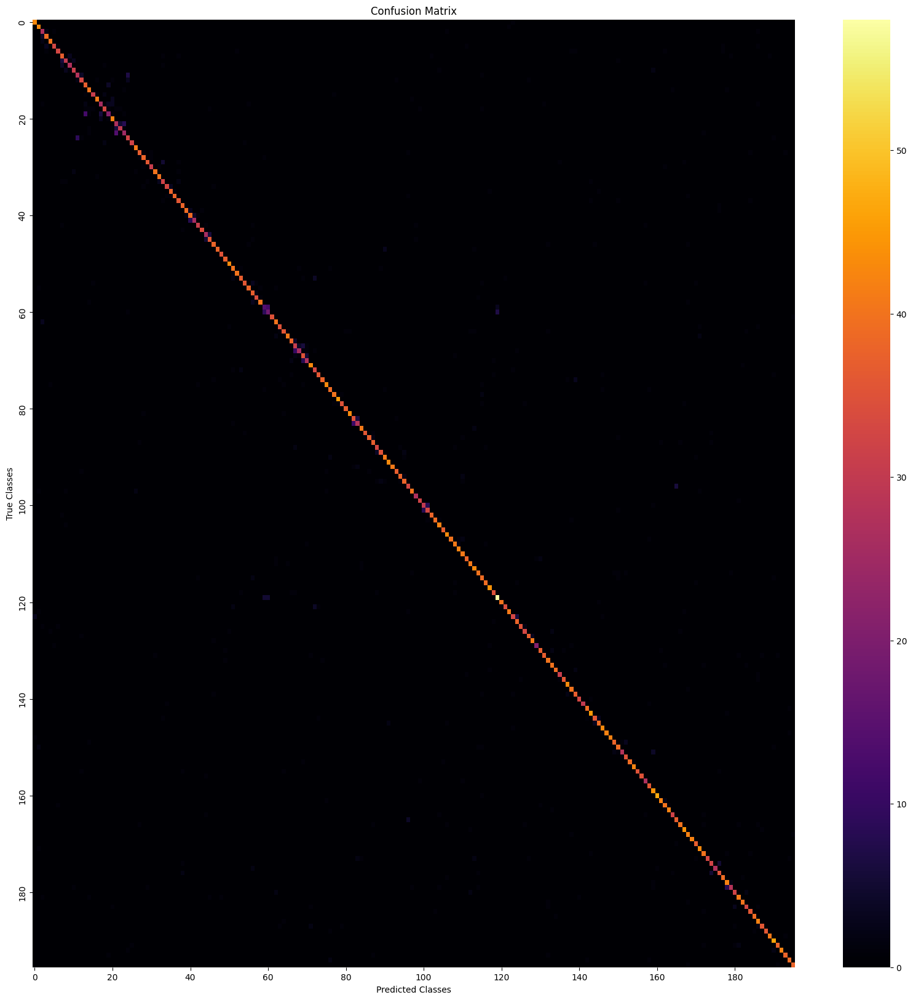

In [ ]:
plt.figure(figsize=(20,20))
sns.heatmap(df_cm, cmap='inferno', xticklabels=20, yticklabels=20)  # Show labels every 20 classes
plt.title('Confusion Matrix')
plt.xlabel('Predicted Classes')
plt.ylabel('True Classes')
plt.savefig('confusion_matrix.png', bbox_inches='tight')
plt.show()

## Extraction des features <a class="anchor" id="43"></a>

In [ ]:
# Pour voir l’architecture du model pour manipuler les layers
print(model)

In [ ]:
# Setup hook
activations = {}
def get_activation(name):
    def hook(model, input, output):
        activations[name] = output.detach()
    return hook

# Register hook to the first layer
model.layer1[0].conv1.register_forward_hook(get_activation('layer1_conv1'))
model.layer4[1].conv2.register_forward_hook(get_activation('layer4_conv2'))

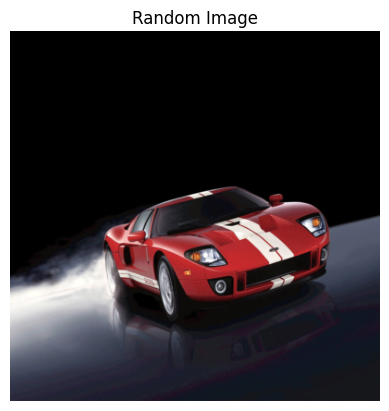

In [ ]:
def get_random_image(dataloader):
    total_batches = len(dataloader)
    random_batch_index = random.randint(0, total_batches - 1)

    for i, (images, labels) in enumerate(dataloader):
        if i == random_batch_index:
            random_image_index = random.randint(0, images.size(0) - 1)
            return images[random_image_index], labels[random_image_index]
        
        
# Get a random image and its corresponding label
image, label = get_random_image(test_loader)

image_formated = image.permute(1, 2, 0)  # Reorder dimensions to (H, W, C)

# Assuming the tensor was normalized or needs to be scaled to [0,1] range for display
image_formated = (image_formated - image_formated.min()) / (image_formated.max() - image_formated.min())  # Normalize to [0, 1]

plt.imshow(image_formated.numpy())  # Convert to numpy array and plot
plt.title("Random Image")
plt.axis('off')  # Hide axes
plt.savefig('example_image.png', bbox_inches='tight')
plt.show()

In [ ]:
def plot_activations(layer_activations, fl, num_cols=8):
    # layer_activations should be a tensor of shape (num_filters, H, W)
    num_channels = layer_activations.size(0)
    fig, axes = plt.subplots((num_channels + num_cols - 1) // num_cols, num_cols, figsize=(num_cols * 2, (num_channels + num_cols - 1) // num_cols * 2))
    for i, ax in enumerate(axes.flat):
        if i < num_channels:
            ax.imshow(layer_activations[i].cpu().numpy(), cmap='inferno')
            ax.axis('off')
        else:
            ax.axis('off')
    plt.tight_layout()
    if fl:
        plt.savefig('first_layer_activation.png', bbox_inches='tight')
    else:
        plt.savefig('last_layer_activation.png', bbox_inches='tight')
    plt.show()

### Premier layer d'activation <a class="anchor" id="431"></a>

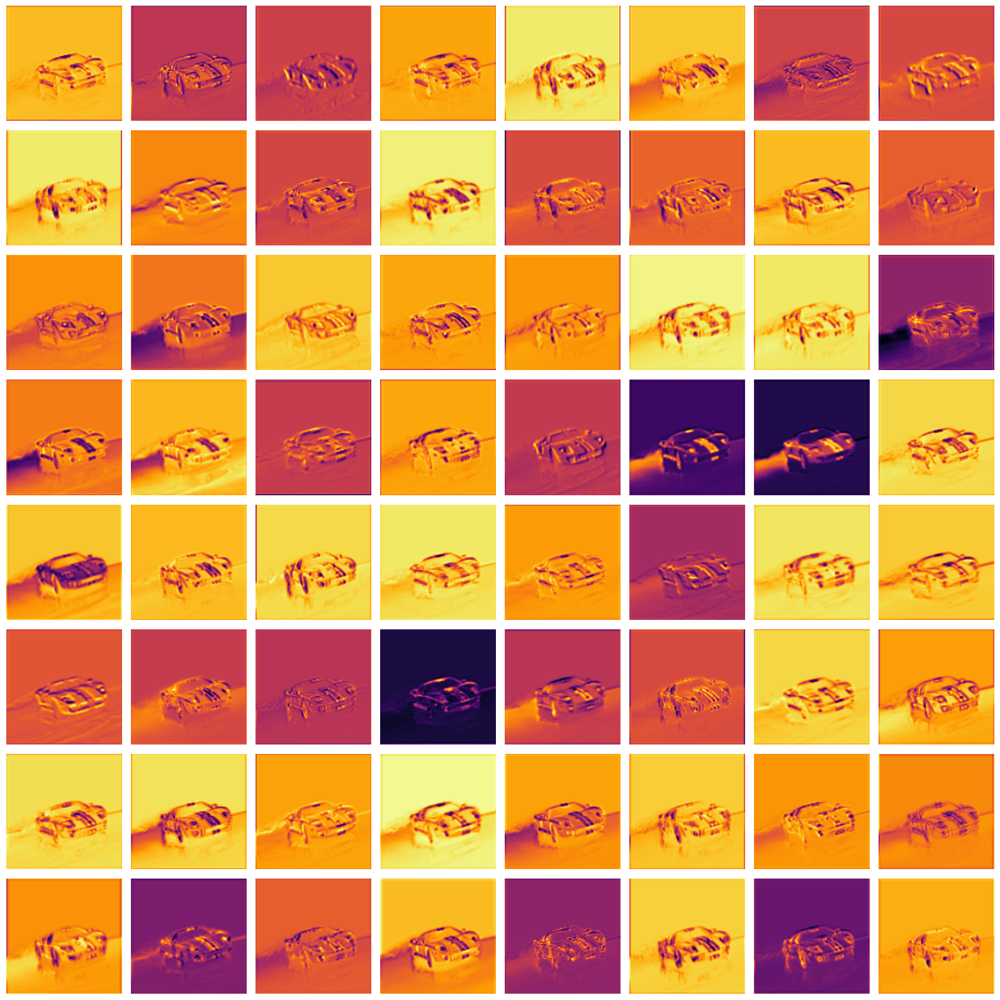

In [ ]:
with torch.no_grad():    
    image = image.to(device)
    image = image.unsqueeze(0)
    output = model(image)
    layer_activations_1 = activations['layer1_conv1'].squeeze()
    plot_activations(layer_activations_1, True)

### Dernier layer d'activation  <a class="anchor" id="432"></a>

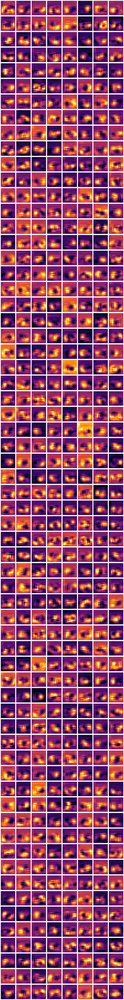

In [ ]:
with torch.no_grad():    
    output = model(image)
    layer_activations_2 = activations['layer4_conv2'].squeeze()
    plot_activations(layer_activations_2, False)

## Analyse des erreurs  <a class="anchor" id="44"></a>

In [ ]:
# Assume model, test_loader and device are already defined
model.eval()  # Set the model to evaluation mode

misclassified_examples = []

with torch.no_grad():  # No need to track gradients
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predictions = torch.max(outputs, 1)
        
        misclassifications = predictions != labels
        for image, label, prediction in zip(images[misclassifications], labels[misclassifications], predictions[misclassifications]):
            misclassified_examples.append((image.cpu(), label.cpu(), prediction.cpu()))

In [ ]:
misclassified_df = [{'Label': label.item(), 'Prediction': prediction.item()} for _, label, prediction in misclassified_examples]
misclassified_df = pd.DataFrame(misclassified_df)
misclassified_df

,Label,Prediction
0,0,123
1,1,122
2,2,186
3,2,3
4,2,3
...,...,...
849,194,76
850,194,158
851,194,76
852,195,168


In [ ]:
misclassified_df['Label_name'] = misclassified_df['Label'].apply(lambda x : train_set.classes[x])
misclassified_df['Prediction_name'] = misclassified_df['Prediction'].apply(lambda x : train_set.classes[x])
misclassified_df.to_csv('error_df_best_model.csv', index=False)

In [ ]:
misclassified_df[:20]

,Label,Prediction,Label_name,Prediction_name
0,0,123,AM General Hummer SUV 2000,HUMMER H2 SUT Crew Cab 2009
1,1,122,Acura Integra Type R 2001,Geo Metro Convertible 1993
2,2,186,Acura RL Sedan 2012,Toyota Camry Sedan 2012
3,2,3,Acura RL Sedan 2012,Acura TL Sedan 2012
4,2,3,Acura RL Sedan 2012,Acura TL Sedan 2012
5,2,5,Acura RL Sedan 2012,Acura TSX Sedan 2012
6,2,106,Acura RL Sedan 2012,Ford Edge SUV 2012
7,3,2,Acura TL Sedan 2012,Acura RL Sedan 2012
8,3,2,Acura TL Sedan 2012,Acura RL Sedan 2012
9,3,2,Acura TL Sedan 2012,Acura RL Sedan 2012


In [ ]:
def retrieve_images_of_class(dataset, class_index, num_images=1):
    images = []
    for image, label in train_set:
        if label == class_index:
            images.append(image)
            if len(images) == num_images:
                break
    return images

### TRUE CLASS ###


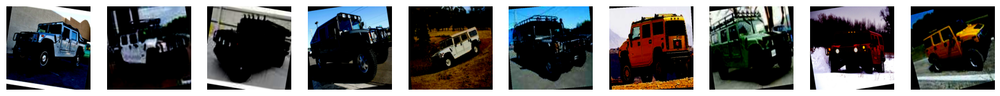

### PREDICTED CLASS ###


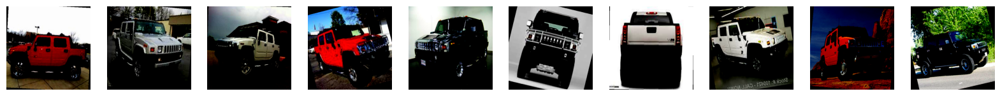

In [ ]:
print("### TRUE CLASS ###")
# Retrieve images|
desired_images = retrieve_images_of_class(train_set, 0, num_images=10)

# Display the images
fig, axes = plt.subplots(1, len(desired_images), figsize=(20, 5))
for ax, img_tensor in zip(axes, desired_images):
    ax.imshow(img_tensor.permute(1, 2, 0))  # Reorder dimensions for displaying
    ax.axis('off')
plt.show()


print("### PREDICTED CLASS ###")
# Retrieve images|
desired_images = retrieve_images_of_class(train_set, 123, num_images=10)

# Display the images
fig, axes = plt.subplots(1, len(desired_images), figsize=(20, 5))
for ax, img_tensor in zip(axes, desired_images):
    ax.imshow(img_tensor.permute(1, 2, 0))  # Reorder dimensions for displaying
    ax.axis('off')
plt.show()

In [ ]:
for image, label, prediction in misclassified_examples:  # Adjust as needed to view more cases
    if (label.item() in [17, 23, 21]):
        imshow(torchvision.utils.make_grid(image.unsqueeze(0)))
        print(f"True label: {label.item()}, Predicted label: {prediction.item()}")

In [ ]:
error_counts = collections.Counter()
for _, true_label, _ in misclassified_examples:
    error_counts[true_label.item()] += 1

In [ ]:
# Convert the counter to a DataFrame
error_df = pd.DataFrame(list(error_counts.items()), columns=['Class', 'Error Count'])
error_df = error_df.sort_values(by="Error Count", ascending=False)
error_df['Class_name'] = error_df['Class'].apply(lambda x : train_set.classes[x])

In [ ]:
error_df

,Class,Error Count,Class_name
8,60,13,Chevrolet Express Van 2007
27,70,9,Chevrolet Silverado 2500HD Regular Cab 2012
31,68,7,Chevrolet Silverado 1500 Hybrid Crew Cab 2012
104,186,7,Toyota Camry Sedan 2012
55,12,7,Audi 100 Wagon 1994
...,...,...,...
139,157,1,Maybach Landaulet Convertible 2012
144,149,1,Lamborghini Aventador Coupe 2012
145,142,1,Isuzu Ascender SUV 2008
154,169,1,Nissan Leaf Hatchback 2012


In [ ]:
error_df.to_csv('error_df_v1.csv', index=False)

In [ ]:
def create_variable_for_error(df, col):
    df[col+'_year'] = df[col+'_name'].str.extract(r'(\b\d{4}\b)$')
    df[col+'_model_name'] = df[col+'_name'].str.replace(r'\b\d{4}\b$', '', regex=True)
    df[col+'_marque'] = df[col+'_model_name'].str.extract(r'^(\w+(-\w+)?)')[0]
    return df

In [ ]:
error_df = create_variable_for_error(error_df, 'Prediction')
error_df = create_variable_for_error(error_df, 'Label')

### Analyse des erreurs en fonction des catégories <a class="anchor" id="441"></a>

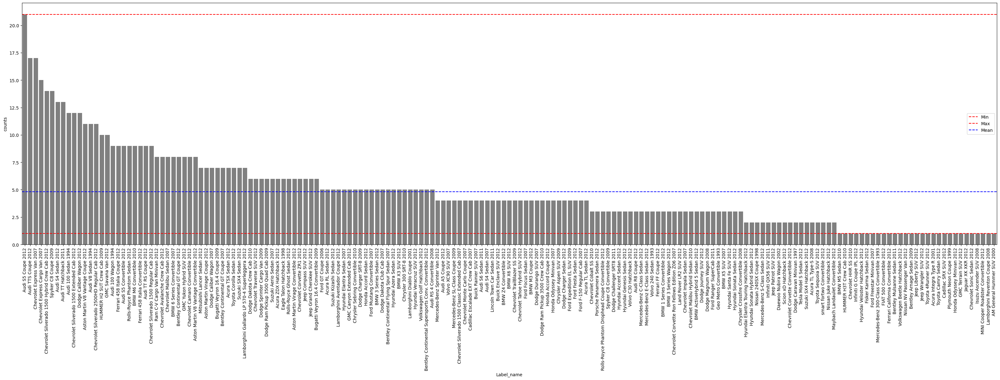

In [ ]:
plot_class_count(error_df, 'Label_name', '')

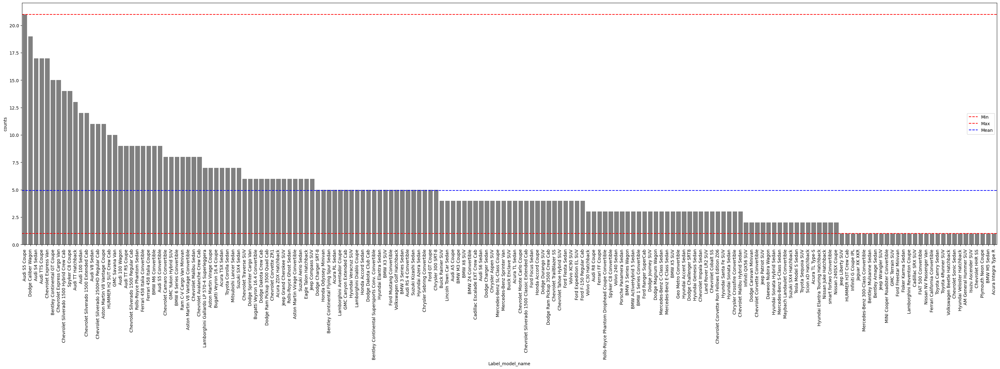

In [ ]:
plot_class_count(error_df, 'Label_model_name', '')

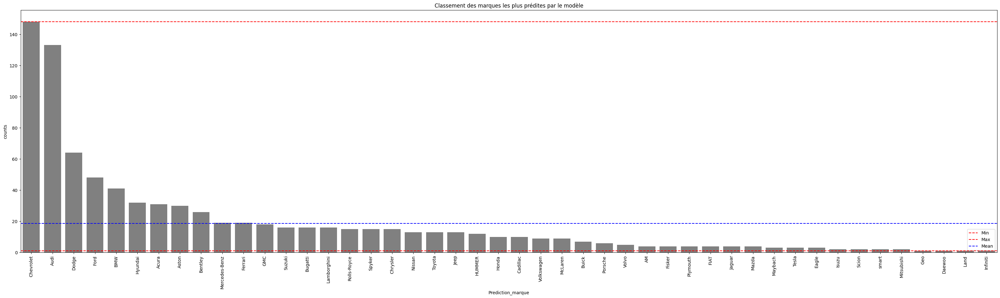

In [ ]:
plot_class_count(error_df, 'Prediction_marque', 'Classement des marques les plus prédites par le modèle')

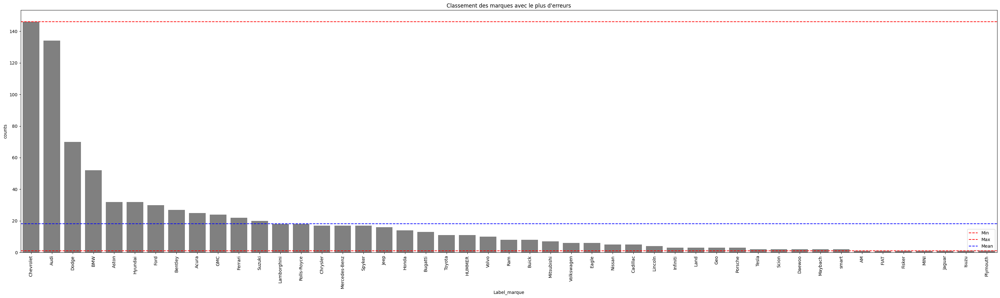

In [ ]:
plot_class_count(error_df, 'Label_marque', 'Classement des marques avec le plus d\'erreurs')

In [ ]:
fig = plt.figure(figsize=(40, 10))
col = 'marque'

total_counts = df['marque'].value_counts().sort_values(ascending=False).reset_index()
total_counts.columns = [col, 'counts'] 

error_counts = error_df['Label_marque'].value_counts().sort_values(ascending=False).reset_index()
error_counts.columns = [col, 'counts']  

sns.barplot(x=col, y='counts', data=total_counts, color='green', label='proportion de marques bien prédites')
sns.barplot(x=col, y='counts', data=error_counts, color='red', label='proportion de marques mal prédites')
plt.xticks(rotation=90)

plt.title('Représentation des marques et de la proportion d\erreurs de prédictions')
plt.show()

In [ ]:
prop_df = pd.merge(total_counts, error_counts, how='right', on='marque')
prop_df.rename(columns={'counts_x': 'total', 'counts_y': 'erreur_prediction'}, inplace=True)
prop_df['proportion_erreur'] = prop_df['erreur_prediction'] / prop_df['total']

plt.figure(figsize=(12, 5))

# Tracer l'histogramme avec les valeurs triées
order = prop_df.sort_values(by='proportion_erreur', ascending=False)['marque']
sns.barplot(x='marque', y='proportion_erreur', data=prop_df, order=order, color='grey')
plt.xticks(rotation=90)
plt.title('Proportion d\'erreurs dans chaque marque')
plt.show()

In [ ]:
good_pred = list(set(df['name'].values) - set(error_df['Prediction_name'].unique()))

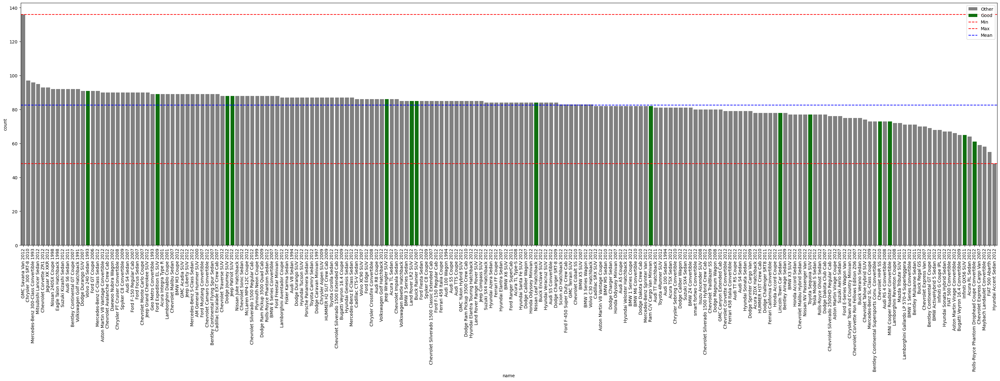

In [ ]:
def plot_class_count_(df, col, title, good_pred):
    fig = plt.figure(figsize=(40, 10))
    
    # Tracer l'histogramme avec les valeurs triées
    order = df[col].value_counts().sort_values(ascending=False).index
    df['Color'] = df[col].apply(lambda x: 'Good' if x in good_pred else 'Other')
    palette = {'Good':'green', 'Other':'grey'}
    sns.countplot(data=df, x=col, order=order, hue='Color', palette=palette)    
    plt.xticks(rotation=90)

    value_counts = df[col].value_counts()
    min_val = value_counts.min()
    max_val = value_counts.max()
    mean_val = value_counts.mean()

    # Tracer les lignes pour min, max et mean
    plt.axhline(min_val, color='red', linestyle='--', label='Min')
    plt.axhline(max_val, color='red', linestyle='--', label='Max')
    plt.axhline(mean_val, color='blue', linestyle='--', label='Mean')
    plt.title(title)
    plt.legend()
    plt.show()


plot_class_count_(df, 'name', '', good_pred)

## Analyse des erreurs Intra-Classe <a class="anchor" id="442"></a>

Le graphe nous indique 2 cas:

- cas 1: le modèle a réussi a trouvé le modèle sans l'année mais peine a trouver la bonne année de modèle

- cas 2: le modèle a réussi a trouvé la marque de la voiture mais peine à trouver le bon modèle (sans l'année)

Dans le cas 2 il y'a plus d'erreurs que dans le cas 1. Nous pouvons retenir que notre modèle est très performant pour trouver la marque de voiture, mais la détection du modèle sans l'année reste à désirer. Dans la suite de notre travail, pour pouvoir réduire notre erreur intra-classe, nous allons développer un modèle spécialiser dans la tétection de classe pour des marques spécifiques.

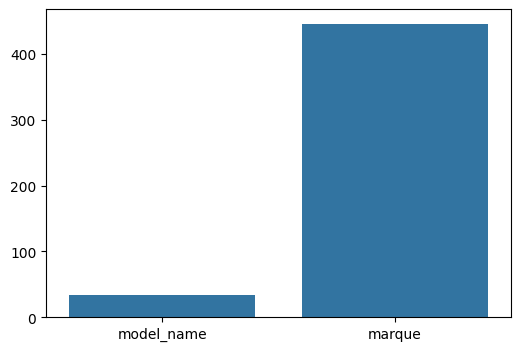

In [ ]:
warnings.filterwarnings("ignore", message="Passing `palette` without assigning `hue` is deprecated")
err_counts = []
err_type = ['model_name', 'marque']

for t in err_type:
    nb = len(error_df[error_df['Prediction_'+t]==error_df['Label_'+t]])
    err_counts.append(nb)

plt.figure(figsize=(6, 4))
sns.barplot(y=err_counts, x=err_type)
plt.show()

In [ ]:
def lien_data_perf(df, error_df, col):
    existants = pd.DataFrame({col: df[col].unique()})

    occ_err_df = pd.merge(existants, df[col].value_counts(), on=col, how='left').fillna(0)
    occ_err_df = pd.merge(occ_err_df, error_df['Label_'+col].value_counts(), 
                          left_on=col, right_on='Label_'+col, how='left').fillna(0)
    
    occ_err_df.rename(columns={'count_x': '#occurrence', 'count_y': '#erreur'}, inplace=True)
    return occ_err_df

In [ ]:
lien_marque = lien_data_perf(df, error_df, 'marque')
lien_model_name = lien_data_perf(df, error_df, 'model_name')
lien_name = lien_data_perf(df, error_df, 'name')

fig, axes = plt.subplots(2, 3, figsize=(20, 10))
x, y = '#occurrence', '#erreur'

sns.scatterplot(data=lien_marque, x=x, y=y, color='blue', ax=axes[0, 0])
sns.regplot(data=lien_marque, x=x, y=y, color='blue', ax=axes[0, 0], scatter=False)
sns.kdeplot(data=lien_marque, x=x, y=y, color='blue', ax=axes[1, 0])
axes[0, 0].set_title('#erreurs selon la prédominance des marques')

sns.scatterplot(data=lien_model_name, x=x, y=y, color='green', ax=axes[0, 1])
sns.regplot(data=lien_model_name, x=x, y=y, color='green', ax=axes[0, 1], scatter=False)
sns.kdeplot(data=lien_model_name, x=x, y=y, color='green', ax=axes[1, 1])
axes[0, 1].set_title('#erreurs selon la prédominance des model_name (sans year)')

sns.scatterplot(data=lien_name, x=x, y=y, color='brown', ax=axes[0, 2])
sns.regplot(data=lien_name, x=x, y=y, color='brown', ax=axes[0, 2], scatter=False)
sns.kdeplot(data=lien_name, x=x, y=y, color='brown', ax=axes[1, 2])
axes[0, 2].set_title('#erreurs selon la prédominance des classes')

plt.tight_layout()
plt.show()

## Grad-cam <a class="anchor" id="45"></a>

In [ ]:
def get_all_files_from_class(class_name):
    folder_path = os.path.join("/kaggle/input/stanford-car-dataset-by-classes-folder/car_data/car_data/train/", class_name + "/")
    file_names = os.listdir(folder_path)
    return file_names

In [ ]:
def visualize_score(visualization, score):
    visualization = cv2.putText(visualization, "(Least first - Most first)/2", (10, 20), 
                                cv2.FONT_HERSHEY_SIMPLEX, 0.3, (255,255,255), 1, cv2.LINE_AA)
    visualization = cv2.putText(visualization, "Remove and Debias", (10, 40), 
                                cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255,255,255), 1, cv2.LINE_AA) 
    visualization = cv2.putText(visualization, f"{score:.5f}", (10, 60), 
                                cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255,255,255), 1, cv2.LINE_AA)
    return visualization


def get_gradiant_cam_of_model(class_name):
    cam_images = []

    target_layers = [trained_model.layer4]
    targets = [ClassifierOutputTarget(195)]
    metric_targets = [ClassifierOutputSoftmaxTarget(195)]
    
    cam = EigenGradCAM(model=model, target_layers=target_layers)
    cam_metric = ROADCombined(percentiles=[20, 40, 60, 80])
    
    file_names = get_all_files_from_class(class_name)
    
    for file in file_names:
        image_path = "/kaggle/input/stanford-car-dataset-by-classes-folder/car_data/car_data/train/" + class_name + "/" + file 

        img = np.array(Image.open(image_path))
        img = cv2.resize(img, (224, 224))
        img = np.float32(img) / 255

        input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]).to(device)
        
        attributions = cam(input_tensor=input_tensor, targets=targets)
        scores = cam_metric(input_tensor, attributions, metric_targets, model)
        
        cam_image = show_cam_on_image(img, attributions[0, :], use_rgb=True)
        cam_image = visualize_score(cam_image, scores[0])
        
        cam_images.append(cam_image)

    max_images_per_row = 6
    for i in range(0, len(cam_images), max_images_per_row):
        images_row = cam_images[i:i+max_images_per_row]
        row_image = np.hstack(images_row)
        display(Image.fromarray(row_image))

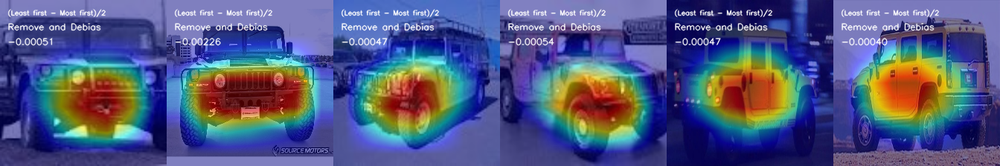

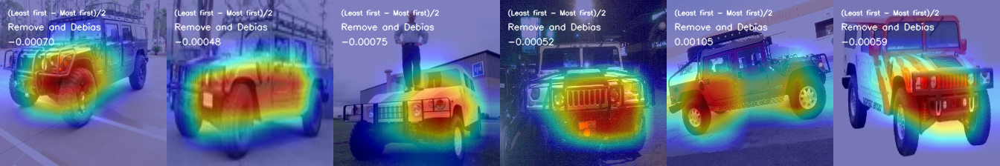

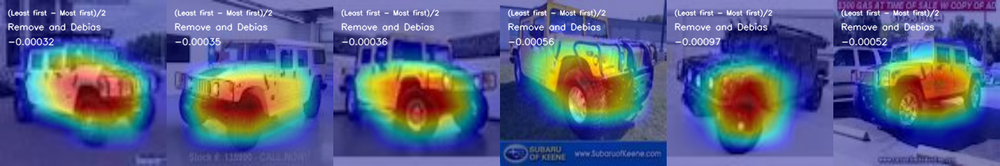

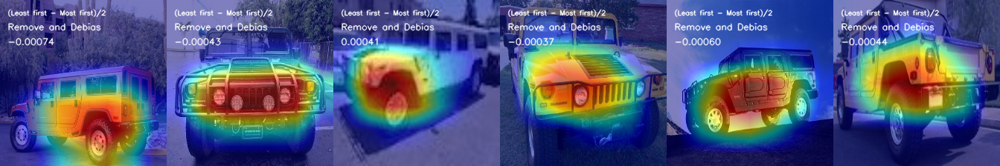

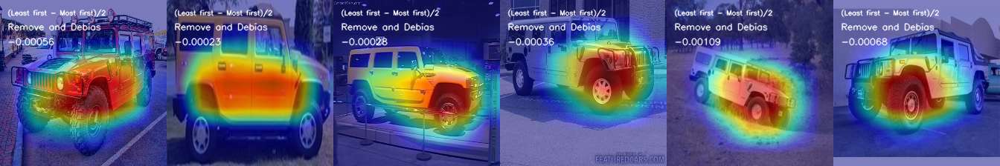

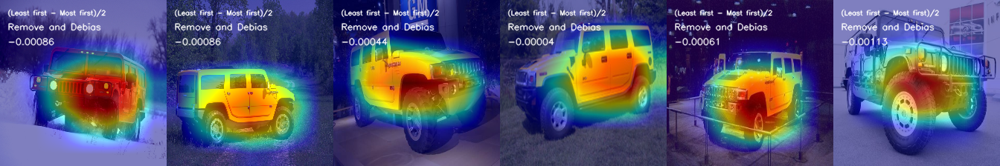

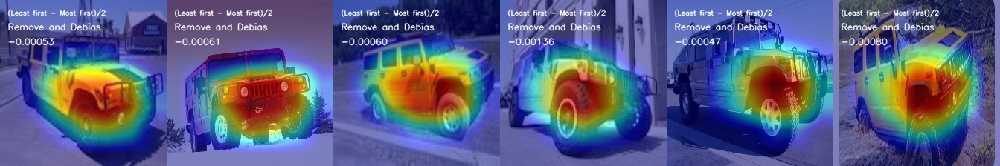

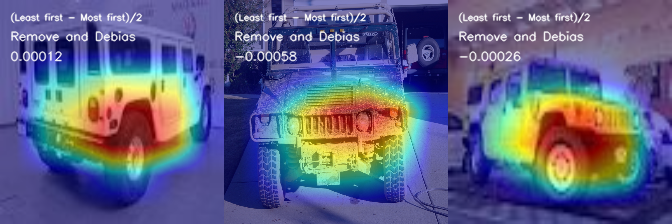

In [ ]:
get_gradiant_cam_of_model("AM General Hummer SUV 2000")
#get_gradiant_cam_of_model("Bentley Continental GT Coupe 2007")

### Comparaison de 2 modèles de voitures ressemblant <a class="anchor" id="451"></a>

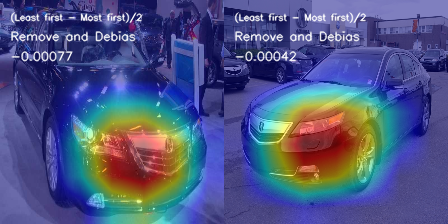

In [ ]:
# code de 2 modèles qui se ressemblent avec grad
rl = "/kaggle/input/stanford-car-dataset-by-classes-folder/car_data/car_data/train/Acura RL Sedan 2012/03875.jpg"
tl = "/kaggle/input/stanford-car-dataset-by-classes-folder/car_data/car_data/train/Acura TL Sedan 2012/00002.jpg"

def grad_on_similar_images():
    cam_images = []

    target_layers = [trained_model.layer4]
    targets = [ClassifierOutputTarget(195)]
    metric_targets = [ClassifierOutputSoftmaxTarget(195)]
    
    cam = EigenGradCAM(model=model, target_layers=target_layers)
    cam_metric = ROADCombined(percentiles=[20, 40, 60, 80])
    
    file_names = [rl, tl]
    
    for image_path in file_names:
        img = np.array(Image.open(image_path))
        img = cv2.resize(img, (224, 224))
        img = np.float32(img) / 255

        input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]).to(device)
        
        attributions = cam(input_tensor=input_tensor, targets=targets)
        scores = cam_metric(input_tensor, attributions, metric_targets, model)
        
        cam_image = show_cam_on_image(img, attributions[0, :], use_rgb=True)
        cam_image = visualize_score(cam_image, scores[0])
        
        cam_images.append(cam_image)

    res = np.hstack(cam_images)
    display(Image.fromarray(res))
    
grad_on_similar_images()

### Décomposition des masques <a class="anchor" id="452"></a>

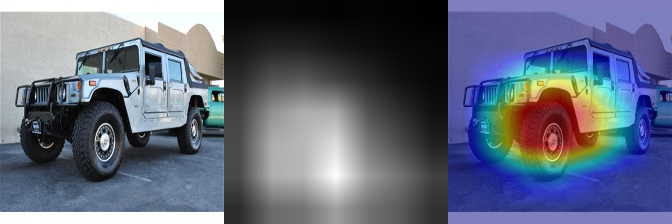

In [ ]:
# Black pixel
file = "/kaggle/input/stanford-car-dataset-by-classes-folder/car_data/car_data/train/AM General Hummer SUV 2000/00163.jpg"

target_layers = [trained_model.layer4]
targets = [ClassifierOutputTarget(195)]
metric_targets = [ClassifierOutputSoftmaxTarget(195)]
    
cam = EigenGradCAM(model=model, target_layers=target_layers)
cam_metric = ROADCombined(percentiles=[20, 40, 60, 80])
    
img = np.array(Image.open(file))
img = cv2.resize(img, (224, 224))
img = np.float32(img) / 255

input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]).to(device)
        
attributions = cam(input_tensor=input_tensor, targets=targets)
        
cam_image = show_cam_on_image(img, attributions[0, :], use_rgb=True)
cam = np.uint8(255*grayscale_cams[0, :])
cam = cv2.merge([cam, cam, cam])
images = np.hstack((np.uint8(255*img), cam , cam_image))
Image.fromarray(images)